In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#  Project on prediction of  Life expectancy in different countries in world 

# 1.Problem Definition >> Predict the Life-span of human in world 

# 2. Data Gathering

In [3]:
# data for life expectnacy is taken from kaggle.
# data present in csv format.


In [4]:
df=pd.read_csv('Life Expectancy Data.csv')
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


C:\Users\welcome\Downloads\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Status', ylabel='count'>

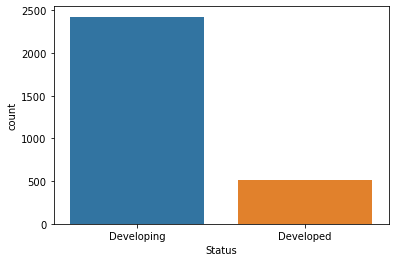

In [5]:
sns.countplot(df['Status'])

In [6]:
status=df['Status']
status_df=pd.DataFrame(status)
status_df

,Status
0,Developing
1,Developing
2,Developing
3,Developing
4,Developing
...,...
2933,Developing
2934,Developing
2935,Developing
2936,Developing


In [7]:
# size of data
df.shape

(2938, 22)

In [8]:
# check duplicates in data
df.duplicated().sum()

# NO duplicate data found

0

In [9]:
# check dadatype of each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [10]:
# check 5 point summary of data
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [11]:
#check missing value in data
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

### KNN-Imputation

In [12]:
import pandas as pd
from sklearn.impute import KNNImputer

# Assuming df is your DataFrame with missing values
# Replace 'your_dataset.csv' with your actual dataset file
df = pd.read_csv('Life expectancy Data.csv')
df=df.drop(['Status','Country'],axis=1)

# Initialize the KNNImputer with the desired number of neighbors (e.g., 5)
knn_imputer = KNNImputer(n_neighbors=10)

# Perform imputation
df_imputed = knn_imputer.fit_transform(df)

# Convert the result back to a DataFrame
df_imputed = pd.DataFrame(df_imputed, columns=df.columns)

# Now, df_imputed contains the original data with missing values filled using k-nearest neighbors imputation

# You can save the imputed DataFrame to a new CSV file if needed
New_life_expectancy=df_imputed.to_csv('imputed_dataset.csv', index=False)


In [13]:
# Check missing values in data


In [14]:
df_imputed.isnull().sum()

Year                               0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
 BMI                               0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
 HIV/AIDS                          0
GDP                                0
Population                         0
 thinness  1-19 years              0
 thinness 5-9 years                0
Income composition of resources    0
Schooling                          0
dtype: int64

# 3. Explorartory Data Analysis

# 3.1 Univariate Analysis

### 3.1.1 Univariate Analysis using Boxplot

In [15]:
import warnings


warnings.filterwarnings("ignore")

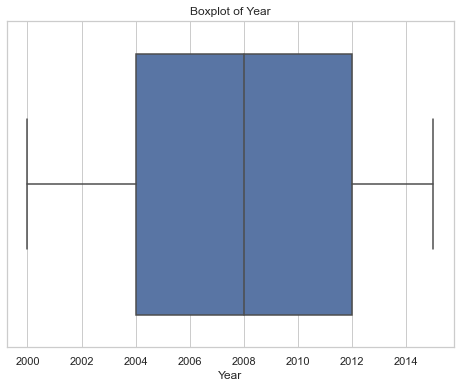

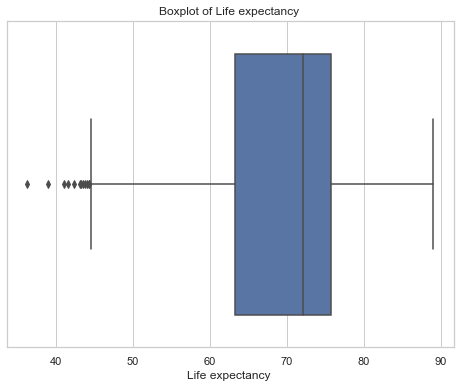

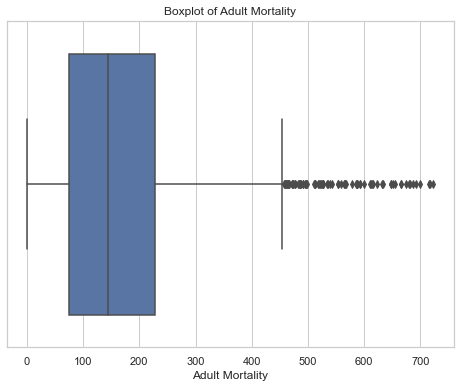

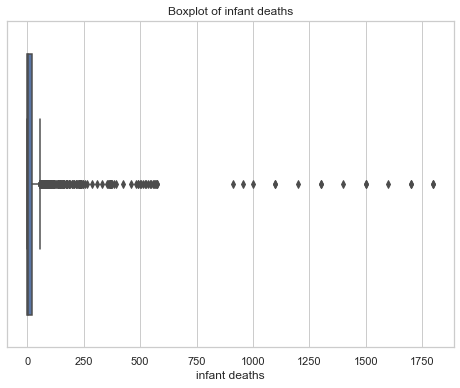

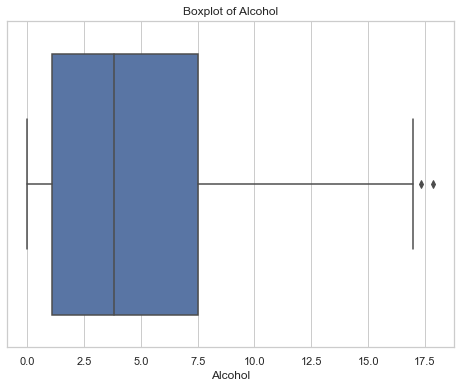

...

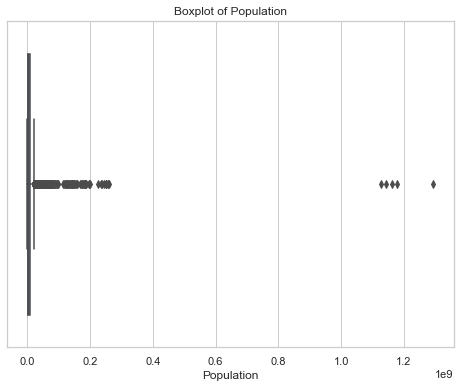

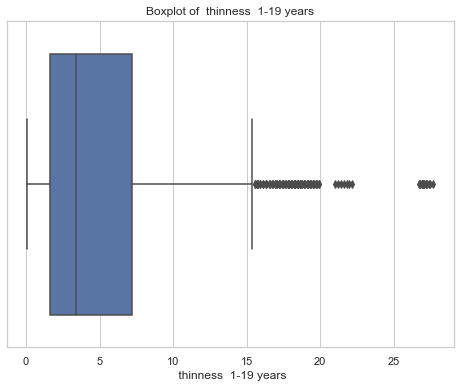

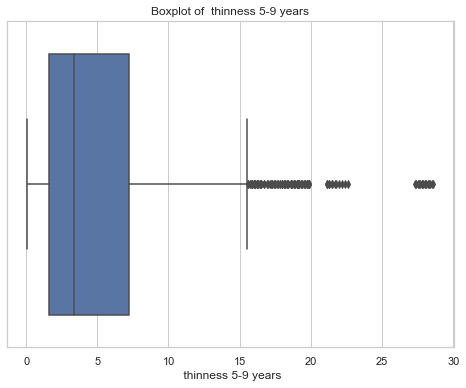

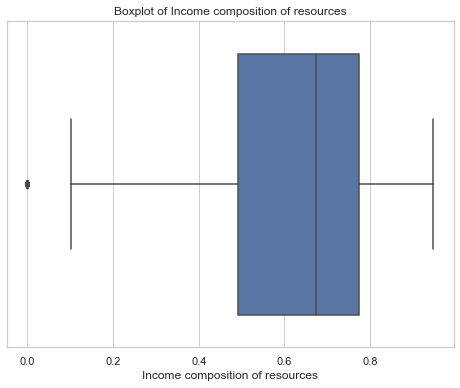

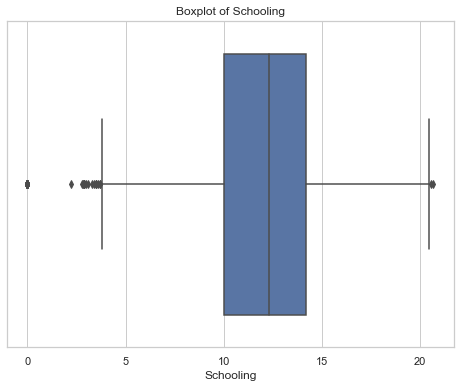

In [16]:
columns_to_plot = df_imputed.columns

 
sns.set(style="whitegrid")


for column in columns_to_plot:
    plt.figure(figsize=(8, 6))  
    sns.boxplot(x=df_imputed[column])
    plt.title(f'Boxplot of {column}')
    plt.show()



### 3.1.2 Univariate analysis using histplot

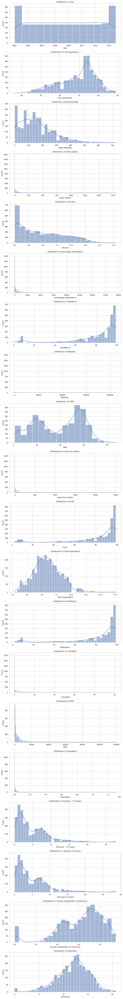

In [17]:
columns_to_plot = df_imputed.columns


sns.set(style="whitegrid")

fig, axes = plt.subplots(nrows=len(columns_to_plot), ncols=1, figsize=(10, 4 * len(columns_to_plot)))


for i, column in enumerate(columns_to_plot):
    sns.histplot(df_imputed[column], kde=True, ax=axes[i])  
    axes[i].set_title(f'Distribution of {column}')


plt.tight_layout()
plt.show()

## 3.2 Bivariate Analysis using seaborn

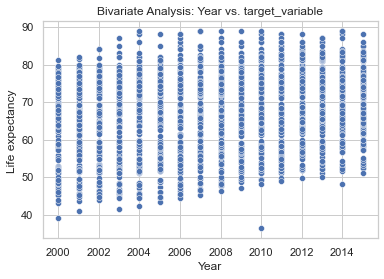

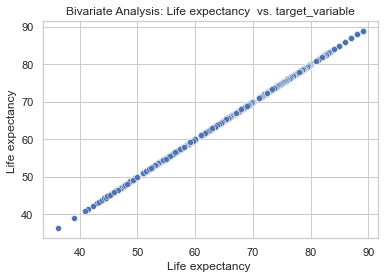

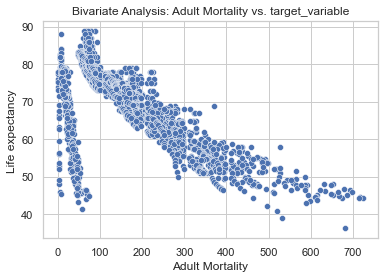

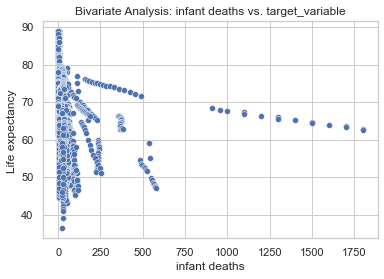

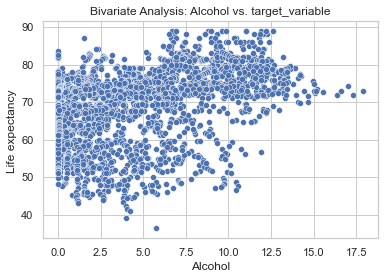

...

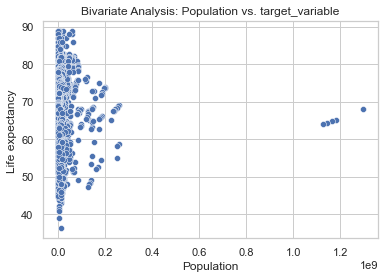

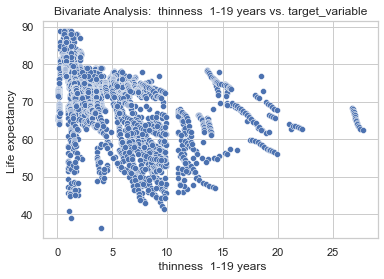

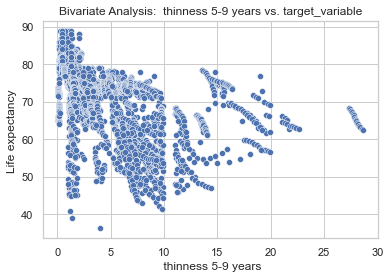

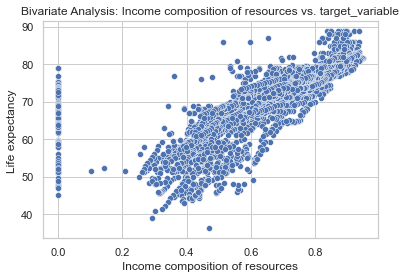

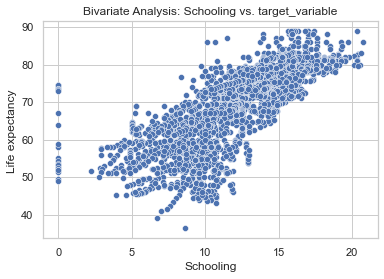

In [18]:
sns.set(style="whitegrid")

# Bivariate analysis using scatter plots
for column in df_imputed.columns:
    if df_imputed[column].dtype != 'object':  
        sns.scatterplot(df_imputed[column] ,y=df['Life expectancy '], data=df_imputed)  
        plt.title(f'Bivariate Analysis: {column} vs. target_variable')
        plt.show()





# 4. Feature engineering 

## 4.1 Outlier handling 

In [19]:
# Function to replace outliers with upper and lower fences
def replace_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1

    lower_fence = Q1 - 1.5 * IQR
    upper_fence = Q3 + 1.5 * IQR

    data = np.where(data < lower_fence, lower_fence, data)
    data = np.where(data > upper_fence, upper_fence, data)

    return data

# Apply the function to replace outliers in each column
df_no_outliers = df_imputed.apply(replace_outliers)


In [20]:
df_no_outliers

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,2015.0,65.0000,263.0,55.0,0.01,71.279624,65.0,900.625,19.1,70.0,49.5,8.16,65.0,0.10,584.259210,19355142.5,15.6,15.6,0.479,10.1
1,2014.0,59.9000,271.0,55.0,0.01,73.523582,62.0,492.000,18.6,70.0,58.0,8.18,62.0,0.10,612.696514,327582.0,15.6,15.6,0.476,10.0
2,2013.0,59.9000,268.0,55.0,0.01,73.219243,64.0,430.000,18.1,70.0,62.0,8.13,64.0,0.10,631.744976,19355142.5,15.6,15.6,0.470,9.9
3,2012.0,59.5000,272.0,55.0,0.01,78.184215,67.0,900.625,17.6,70.0,67.0,8.52,67.0,0.10,669.959000,3696958.0,15.6,15.6,0.463,9.8
4,2011.0,59.2000,275.0,55.0,0.01,7.097109,68.0,900.625,17.2,70.0,68.0,7.87,68.0,0.10,63.537231,2978599.0,15.6,15.6,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2004.0,44.4875,456.5,27.0,4.36,0.000000,68.0,31.000,27.1,42.0,67.0,7.13,65.0,1.85,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,2003.0,44.5000,456.5,26.0,4.06,0.000000,46.0,900.625,26.7,41.0,49.5,6.52,68.0,1.85,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,2002.0,44.8000,73.0,25.0,4.43,0.000000,73.0,304.000,26.3,40.0,73.0,6.53,71.0,1.85,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,2001.0,45.3000,456.5,25.0,1.72,0.000000,76.0,529.000,25.9,39.0,76.0,6.16,75.0,1.85,548.587312,12366165.0,1.6,1.7,0.427,9.8


## check whether outliers are removed or not


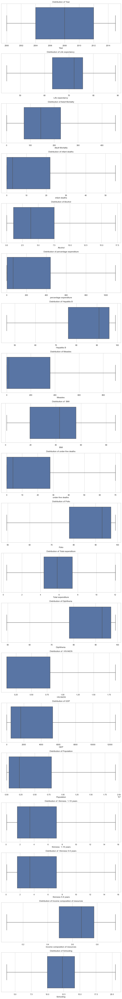

In [21]:
columns_to_plot = df_no_outliers.columns


sns.set(style="whitegrid")


fig, axes = plt.subplots(nrows=len(columns_to_plot), ncols=1, figsize=(10, 4 * len(columns_to_plot)))


for i, column in enumerate(columns_to_plot):
    sns.boxplot(df_no_outliers[column],ax=axes[i]) 
    axes[i].set_title(f'Distribution of {column}')


plt.tight_layout()
plt.show()

### Multivariate Analysis after removal of outliers

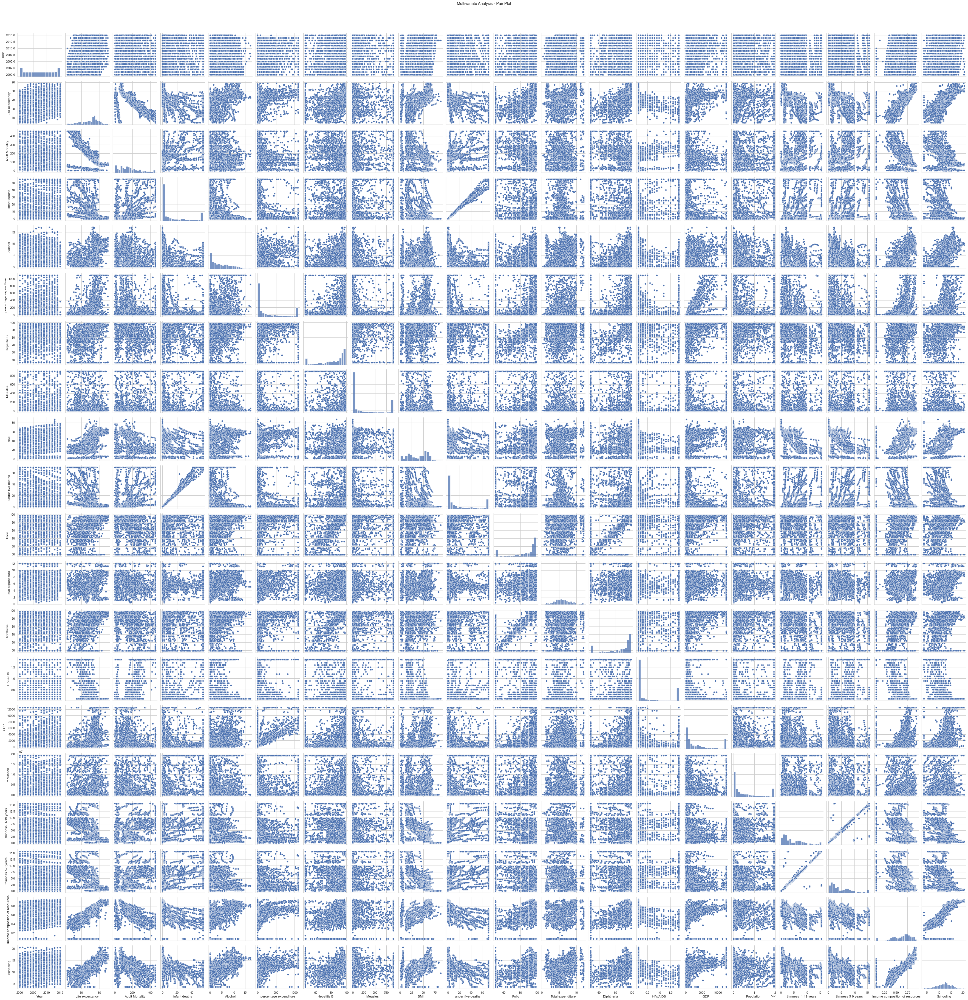

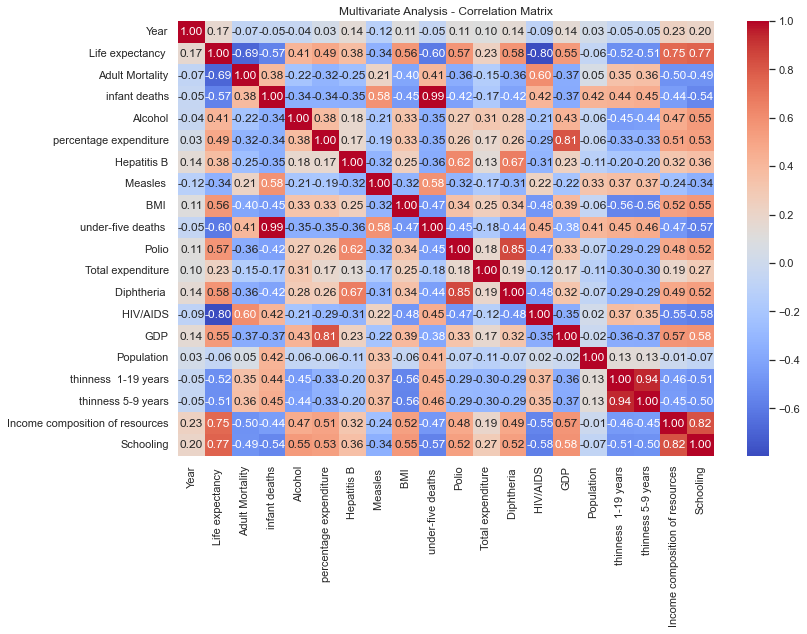

In [22]:

sns.set(style="whitegrid")

# Multivariate analysis using pair plots
sns.pairplot(df_no_outliers)
plt.suptitle('Multivariate Analysis - Pair Plot', y=1.02)
plt.show()

# Multivariate analysis using a correlation matrix and heatmap
correlation_matrix = df_no_outliers.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Multivariate Analysis - Correlation Matrix')
plt.show()


## 4.2 Ordinal Encoding

In [23]:
from sklearn.preprocessing import OrdinalEncoder
oe=OrdinalEncoder(categories=[['Developing','Developed']])
oe

OrdinalEncoder(categories=[['Developing', 'Developed']])

In [24]:
encoded=oe.fit_transform(status_df)
encoded

array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]])

In [25]:
df1=pd.DataFrame(encoded,columns=['Status'])
df1

,Status
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
2933,0.0
2934,0.0
2935,0.0
2936,0.0


In [26]:
df_no_outliers=pd.concat([df_no_outliers,df1],axis=1)
df_no_outliers

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,...,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status
0,2015.0,65.0000,263.0,55.0,0.01,71.279624,65.0,900.625,19.1,70.0,...,8.16,65.0,0.10,584.259210,19355142.5,15.6,15.6,0.479,10.1,0.0
1,2014.0,59.9000,271.0,55.0,0.01,73.523582,62.0,492.000,18.6,70.0,...,8.18,62.0,0.10,612.696514,327582.0,15.6,15.6,0.476,10.0,0.0
2,2013.0,59.9000,268.0,55.0,0.01,73.219243,64.0,430.000,18.1,70.0,...,8.13,64.0,0.10,631.744976,19355142.5,15.6,15.6,0.470,9.9,0.0
3,2012.0,59.5000,272.0,55.0,0.01,78.184215,67.0,900.625,17.6,70.0,...,8.52,67.0,0.10,669.959000,3696958.0,15.6,15.6,0.463,9.8,0.0
4,2011.0,59.2000,275.0,55.0,0.01,7.097109,68.0,900.625,17.2,70.0,...,7.87,68.0,0.10,63.537231,2978599.0,15.6,15.6,0.454,9.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2004.0,44.4875,456.5,27.0,4.36,0.000000,68.0,31.000,27.1,42.0,...,7.13,65.0,1.85,454.366654,12777511.0,9.4,9.4,0.407,9.2,0.0
2934,2003.0,44.5000,456.5,26.0,4.06,0.000000,46.0,900.625,26.7,41.0,...,6.52,68.0,1.85,453.351155,12633897.0,9.8,9.9,0.418,9.5,0.0
2935,2002.0,44.8000,73.0,25.0,4.43,0.000000,73.0,304.000,26.3,40.0,...,6.53,71.0,1.85,57.348340,125525.0,1.2,1.3,0.427,10.0,0.0
2936,2001.0,45.3000,456.5,25.0,1.72,0.000000,76.0,529.000,25.9,39.0,...,6.16,75.0,1.85,548.587312,12366165.0,1.6,1.7,0.427,9.8,0.0


## 4.3 Scaling 

In [27]:
# split the data 
x=df_no_outliers.drop(['Life expectancy '],axis=1)
y=df_no_outliers['Life expectancy ']
x

,Year,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status
0,2015.0,263.0,55.0,0.01,71.279624,65.0,900.625,19.1,70.0,49.5,8.16,65.0,0.10,584.259210,19355142.5,15.6,15.6,0.479,10.1,0.0
1,2014.0,271.0,55.0,0.01,73.523582,62.0,492.000,18.6,70.0,58.0,8.18,62.0,0.10,612.696514,327582.0,15.6,15.6,0.476,10.0,0.0
2,2013.0,268.0,55.0,0.01,73.219243,64.0,430.000,18.1,70.0,62.0,8.13,64.0,0.10,631.744976,19355142.5,15.6,15.6,0.470,9.9,0.0
3,2012.0,272.0,55.0,0.01,78.184215,67.0,900.625,17.6,70.0,67.0,8.52,67.0,0.10,669.959000,3696958.0,15.6,15.6,0.463,9.8,0.0
4,2011.0,275.0,55.0,0.01,7.097109,68.0,900.625,17.2,70.0,68.0,7.87,68.0,0.10,63.537231,2978599.0,15.6,15.6,0.454,9.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2004.0,456.5,27.0,4.36,0.000000,68.0,31.000,27.1,42.0,67.0,7.13,65.0,1.85,454.366654,12777511.0,9.4,9.4,0.407,9.2,0.0
2934,2003.0,456.5,26.0,4.06,0.000000,46.0,900.625,26.7,41.0,49.5,6.52,68.0,1.85,453.351155,12633897.0,9.8,9.9,0.418,9.5,0.0
2935,2002.0,73.0,25.0,4.43,0.000000,73.0,304.000,26.3,40.0,73.0,6.53,71.0,1.85,57.348340,125525.0,1.2,1.3,0.427,10.0,0.0
2936,2001.0,456.5,25.0,1.72,0.000000,76.0,529.000,25.9,39.0,76.0,6.16,75.0,1.85,548.587312,12366165.0,1.6,1.7,0.427,9.8,0.0


In [28]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

df_scaled = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
df_scaled



# Now, df_scaled contains the original data scaled using MinMaxScaler

,Year,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status
0,1.000000,0.575192,1.000000,0.000000,0.064988,0.358491,1.000000,0.209733,1.000000,0.000000,0.667810,0.313131,0.0,0.046148,1.000000,1.000000,1.000000,0.467348,0.380952,0.0
1,0.933333,0.592755,1.000000,0.000000,0.067034,0.301887,0.546287,0.203940,1.000000,0.171717,0.669524,0.252525,0.0,0.048401,0.016923,1.000000,1.000000,0.463941,0.375000,0.0
2,0.866667,0.586169,1.000000,0.000000,0.066757,0.339623,0.477446,0.198146,1.000000,0.252525,0.665238,0.292929,0.0,0.049910,1.000000,1.000000,1.000000,0.457127,0.369048,0.0
3,0.800000,0.594951,1.000000,0.000000,0.071283,0.396226,1.000000,0.192352,1.000000,0.353535,0.698671,0.353535,0.0,0.052937,0.191005,1.000000,1.000000,0.449177,0.363095,0.0
4,0.733333,0.601537,1.000000,0.000000,0.006471,0.415094,1.000000,0.187717,1.000000,0.373737,0.642949,0.373737,0.0,0.004900,0.153890,1.000000,1.000000,0.438955,0.345238,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,0.266667,1.000000,0.490909,0.253257,0.000000,0.415094,0.034421,0.302433,0.600000,0.353535,0.579511,0.313131,1.0,0.035859,0.660160,0.600000,0.600000,0.385576,0.327381,0.0
2934,0.200000,1.000000,0.472727,0.235791,0.000000,0.000000,1.000000,0.297798,0.585714,0.000000,0.527218,0.373737,1.0,0.035778,0.652740,0.625806,0.632258,0.398069,0.345238,0.0
2935,0.133333,0.158068,0.454545,0.257332,0.000000,0.509434,0.337543,0.293163,0.571429,0.474747,0.528075,0.434343,1.0,0.004410,0.006484,0.070968,0.077419,0.408291,0.375000,0.0
2936,0.066667,1.000000,0.454545,0.099556,0.000000,0.566038,0.587370,0.288528,0.557143,0.535354,0.496357,0.515152,1.0,0.043322,0.638908,0.096774,0.103226,0.408291,0.363095,0.0


In [29]:
df_scaled

,Year,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status
0,1.000000,0.575192,1.000000,0.000000,0.064988,0.358491,1.000000,0.209733,1.000000,0.000000,0.667810,0.313131,0.0,0.046148,1.000000,1.000000,1.000000,0.467348,0.380952,0.0
1,0.933333,0.592755,1.000000,0.000000,0.067034,0.301887,0.546287,0.203940,1.000000,0.171717,0.669524,0.252525,0.0,0.048401,0.016923,1.000000,1.000000,0.463941,0.375000,0.0
2,0.866667,0.586169,1.000000,0.000000,0.066757,0.339623,0.477446,0.198146,1.000000,0.252525,0.665238,0.292929,0.0,0.049910,1.000000,1.000000,1.000000,0.457127,0.369048,0.0
3,0.800000,0.594951,1.000000,0.000000,0.071283,0.396226,1.000000,0.192352,1.000000,0.353535,0.698671,0.353535,0.0,0.052937,0.191005,1.000000,1.000000,0.449177,0.363095,0.0
4,0.733333,0.601537,1.000000,0.000000,0.006471,0.415094,1.000000,0.187717,1.000000,0.373737,0.642949,0.373737,0.0,0.004900,0.153890,1.000000,1.000000,0.438955,0.345238,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,0.266667,1.000000,0.490909,0.253257,0.000000,0.415094,0.034421,0.302433,0.600000,0.353535,0.579511,0.313131,1.0,0.035859,0.660160,0.600000,0.600000,0.385576,0.327381,0.0
2934,0.200000,1.000000,0.472727,0.235791,0.000000,0.000000,1.000000,0.297798,0.585714,0.000000,0.527218,0.373737,1.0,0.035778,0.652740,0.625806,0.632258,0.398069,0.345238,0.0
2935,0.133333,0.158068,0.454545,0.257332,0.000000,0.509434,0.337543,0.293163,0.571429,0.474747,0.528075,0.434343,1.0,0.004410,0.006484,0.070968,0.077419,0.408291,0.375000,0.0
2936,0.066667,1.000000,0.454545,0.099556,0.000000,0.566038,0.587370,0.288528,0.557143,0.535354,0.496357,0.515152,1.0,0.043322,0.638908,0.096774,0.103226,0.408291,0.363095,0.0


# 5. Feature Selection

In [30]:
df_scaled=df_scaled.drop(['Year'],axis=1)
df_scaled


,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status
0,0.575192,1.000000,0.000000,0.064988,0.358491,1.000000,0.209733,1.000000,0.000000,0.667810,0.313131,0.0,0.046148,1.000000,1.000000,1.000000,0.467348,0.380952,0.0
1,0.592755,1.000000,0.000000,0.067034,0.301887,0.546287,0.203940,1.000000,0.171717,0.669524,0.252525,0.0,0.048401,0.016923,1.000000,1.000000,0.463941,0.375000,0.0
2,0.586169,1.000000,0.000000,0.066757,0.339623,0.477446,0.198146,1.000000,0.252525,0.665238,0.292929,0.0,0.049910,1.000000,1.000000,1.000000,0.457127,0.369048,0.0
3,0.594951,1.000000,0.000000,0.071283,0.396226,1.000000,0.192352,1.000000,0.353535,0.698671,0.353535,0.0,0.052937,0.191005,1.000000,1.000000,0.449177,0.363095,0.0
4,0.601537,1.000000,0.000000,0.006471,0.415094,1.000000,0.187717,1.000000,0.373737,0.642949,0.373737,0.0,0.004900,0.153890,1.000000,1.000000,0.438955,0.345238,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,1.000000,0.490909,0.253257,0.000000,0.415094,0.034421,0.302433,0.600000,0.353535,0.579511,0.313131,1.0,0.035859,0.660160,0.600000,0.600000,0.385576,0.327381,0.0
2934,1.000000,0.472727,0.235791,0.000000,0.000000,1.000000,0.297798,0.585714,0.000000,0.527218,0.373737,1.0,0.035778,0.652740,0.625806,0.632258,0.398069,0.345238,0.0
2935,0.158068,0.454545,0.257332,0.000000,0.509434,0.337543,0.293163,0.571429,0.474747,0.528075,0.434343,1.0,0.004410,0.006484,0.070968,0.077419,0.408291,0.375000,0.0
2936,1.000000,0.454545,0.099556,0.000000,0.566038,0.587370,0.288528,0.557143,0.535354,0.496357,0.515152,1.0,0.043322,0.638908,0.096774,0.103226,0.408291,0.363095,0.0


In [31]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(df_scaled,y,train_size=.8,random_state=50)
x_train

,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status
1506,0.300768,0.018182,0.363583,0.000000,0.962264,0.091048,0.739282,0.028571,0.959596,0.479126,0.959596,0.000000,0.135177,0.337438,0.367742,0.348387,0.739920,0.577381,0.0
856,0.680571,0.109091,0.036096,0.001436,0.867925,0.091048,0.168019,0.128571,0.858586,0.251179,0.858586,0.514286,0.003333,0.022284,0.574194,0.567742,0.379898,0.089286,0.0
1848,0.013172,0.000000,0.535041,0.842961,0.886792,0.075503,0.752028,0.000000,0.878788,0.956708,0.878788,0.000000,0.316504,0.281163,0.012903,0.012903,0.950028,0.940476,1.0
2822,0.263447,0.018182,0.296922,0.146644,0.849057,0.000000,0.648899,0.014286,0.838384,0.527218,0.838384,0.000000,0.286820,0.171820,0.103226,0.096774,0.771721,0.672619,0.0
663,0.021954,0.018182,0.232880,0.746601,0.943396,0.000000,0.647740,0.014286,1.000000,0.978140,0.939394,0.000000,0.434336,0.256113,0.212903,0.200000,0.811471,0.833333,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014,0.300768,0.200000,0.281784,0.053336,0.886792,0.001110,0.055620,0.200000,0.878788,0.373768,0.878788,0.114286,0.033840,0.147980,0.070968,0.070968,0.718342,0.565476,0.0
2157,0.630077,0.309091,0.413361,0.008357,0.962264,0.005552,0.193511,0.357143,0.878788,0.585512,0.959596,1.000000,0.042575,0.515492,0.419355,0.406452,0.431005,0.386905,0.0
1931,0.032931,0.018182,0.032021,0.117820,1.000000,0.003331,0.588644,0.014286,1.000000,0.203172,1.000000,0.000000,0.152650,0.240341,0.438710,0.432258,0.828507,0.583333,0.0
1504,0.728869,0.254545,0.255585,0.015246,0.245283,1.000000,0.016222,0.285714,0.090909,0.517788,0.000000,1.000000,0.013664,0.154538,0.574194,0.574194,0.361726,0.404762,0.0


# 6.Model Building using ML Algorithms

## 6.1 Linear Regression Model

### 6.1.1 Model object creation

In [32]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
lr

LinearRegression()

### 6.1.2 Model training on training data

In [33]:
linear_model=lr.fit(x_train,y_train)
linear_model

LinearRegression()

In [34]:
linear_model.coef_

array([-7.01983782e+00,  1.75178998e+01, -3.00139728e-01,  1.05305329e+00,
       -1.25887582e+00, -2.03492036e-01,  9.84026880e-03, -2.03218953e+01,
        1.04137885e+00,  1.29831069e+00,  2.50443670e+00, -8.07793216e+00,
        9.03916667e-01,  9.58652010e-01,  8.94485918e-01, -3.01971608e+00,
        6.57699310e+00,  4.80858508e+00,  1.92881985e+00])

### 6.1.3 Prediction on test data

In [35]:
y_pred_linear=linear_model.predict(x_test)
y_pred_linear

array([60.24313693, 81.06769231, 75.82811525, 74.57274737, 73.07339664,
       65.11137324, 54.87126071, 73.07492658, 78.15600553, 74.03134413,
       81.42778801, 82.86602694, 78.81883937, 80.01079893, 72.62310442,
       55.06307608, 60.98543409, 64.87244401, 77.24424608, 48.42508161,
       59.47617989, 79.69053903, 61.89131874, 73.3132908 , 73.26930508,
       70.61795875, 67.66821731, 64.52244054, 59.0202078 , 74.05761282,
       74.10202411, 78.08181508, 73.27951022, 58.22041904, 76.26134275,
       62.07503741, 57.34547742, 74.43433007, 74.61654463, 59.21547288,
       75.83144307, 76.39174799, 81.06050607, 77.57029369, 66.90070795,
       74.58657106, 80.48547661, 62.10771992, 73.2464286 , 76.68218073,
       58.04999378, 68.67122934, 59.11737264, 52.71901577, 69.03828009,
       72.88460601, 67.59074304, 56.42324396, 72.08582967, 68.81715286,
       70.63245723, 56.02130498, 70.71949215, 75.03017668, 77.58195748,
       61.50137895, 66.25706347, 52.89257241, 63.69618026, 59.89

### 6.1.4 Model Evaluation

In [36]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

In [37]:
print("MAE",mean_absolute_error(y_test,y_pred_linear))
print("MSE",mean_squared_error(y_test,y_pred_linear))
print("R2 score",r2_score(y_test,y_pred_linear))

MAE 2.7775908570559866
MSE 14.681008976914061
R2 score 0.8420514244859236


### 6.1.5  Save the model

In [38]:
import os

pickle.dump(linear_model, open('linear_model.pkl', 'wb'))

<IPython.core.display.Javascript object>

## 6.2 Decision Tree Regressor model

### 6.2.1 Model object creation

In [39]:
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor()
dtr

DecisionTreeRegressor()

### 6.2.2 Model training on training data

In [40]:
dtr_model=dtr.fit(x_train,y_train)
dtr_model

DecisionTreeRegressor()

### 6.2.3 Model Prediction on test data

In [41]:
y_pred_dtree=dtr_model.predict(x_test)
y_pred_dtree

array([44.8   , 77.3   , 73.8   , 74.5   , 74.1   , 63.    , 61.4   ,
       72.5   , 76.8   , 78.    , 79.9   , 81.8   , 78.    , 78.9   ,
       78.    , 46.4   , 61.4   , 63.8   , 76.4   , 54.3   , 57.9   ,
       81.5   , 62.    , 76.    , 74.5   , 69.4   , 63.8   , 62.5   ,
       51.9   , 71.2   , 73.5   , 79.1   , 68.2   , 68.    , 74.7   ,
       63.2   , 57.1   , 75.1   , 73.2   , 59.4   , 72.1   , 74.8   ,
       78.    , 81.7   , 61.8   , 76.2   , 78.3   , 69.    , 74.1   ,
       78.8   , 59.1   , 66.3   , 55.3   , 58.    , 73.5   , 74.6   ,
       67.4   , 44.5   , 76.3   , 67.5   , 65.1   , 51.1   , 71.6   ,
       76.    , 81.7   , 69.    , 66.4   , 46.    , 50.    , 59.3   ,
       75.4   , 72.9   , 74.5   , 77.7   , 69.4   , 71.4   , 57.1   ,
       69.3   , 66.6   , 74.8   , 88.    , 79.5   , 54.2   , 82.5   ,
       47.8   , 85.    , 64.    , 74.5   , 76.    , 62.    , 71.1   ,
       73.5   , 65.4   , 74.1   , 78.7   , 73.5   , 51.    , 68.    ,
       74.7   , 56.8

### 6.2.4 Model Evaluation

In [42]:
print("MAE",mean_absolute_error(y_test,y_pred_dtree))
print("MSE",mean_squared_error(y_test,y_pred_dtree))
print("R2 score",r2_score(y_test,y_pred_dtree))

MAE 1.6812967687074827
MSE 7.983342272534014
R2 score 0.9141096131900119


### 6.2.5 Save the model

In [43]:
pickle.dump(dtr_model, open('dtr_model.pkl', 'wb'))

<IPython.core.display.Javascript object>

# 7. Conclusion